<a href="https://colab.research.google.com/github/EmiRoberti77/YOLO11_colac/blob/main/Emi_yolo11_custom_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Custom Data set for Obkevct Detetion ( Emiliano Roberti )

In [1]:
!nvidia-smi

Fri Jul  4 06:03:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import Image

Import dataset from Roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="4R5KV0K430xAvtMVIfvP")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(2)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PPE_Detection-2 in yolov11:: 100%|██████████| 6472/6472 [00:01<00:00, 5798.35it/s]


In [7]:
dataset.location

'/content/PPE_Detection-2'

Train YOLO11 Model on Custom Dataset

In [9]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=40 imgsz=640

100% 5.35M/5.35M [00:00<00:00, 110MB/s]
Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/PPE_Detection-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, pers

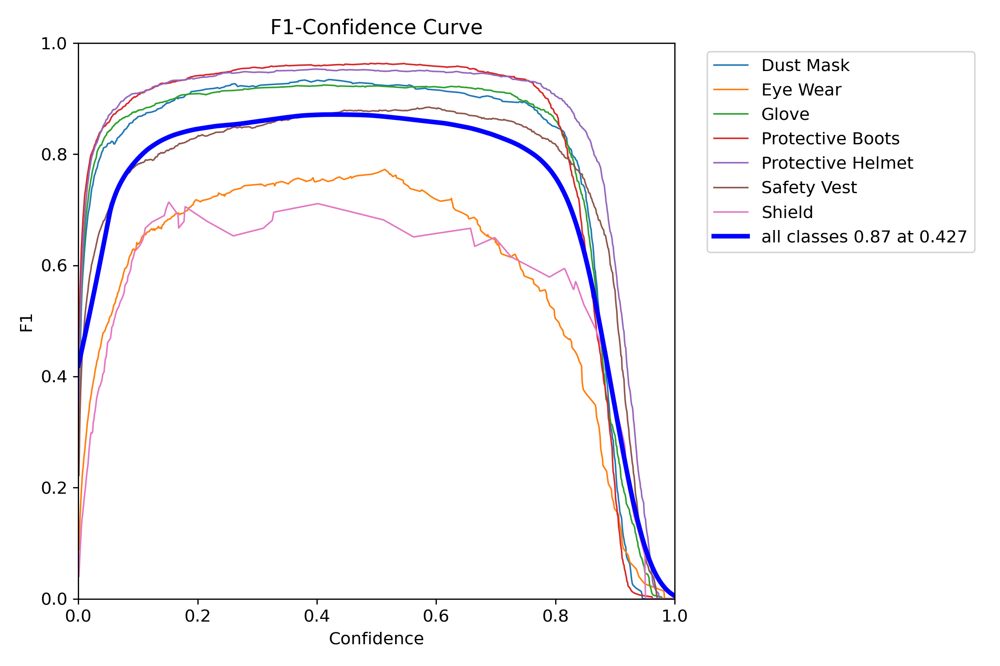

In [15]:
Image("/content/runs/detect/train/BoxF1_curve.png", width=600)

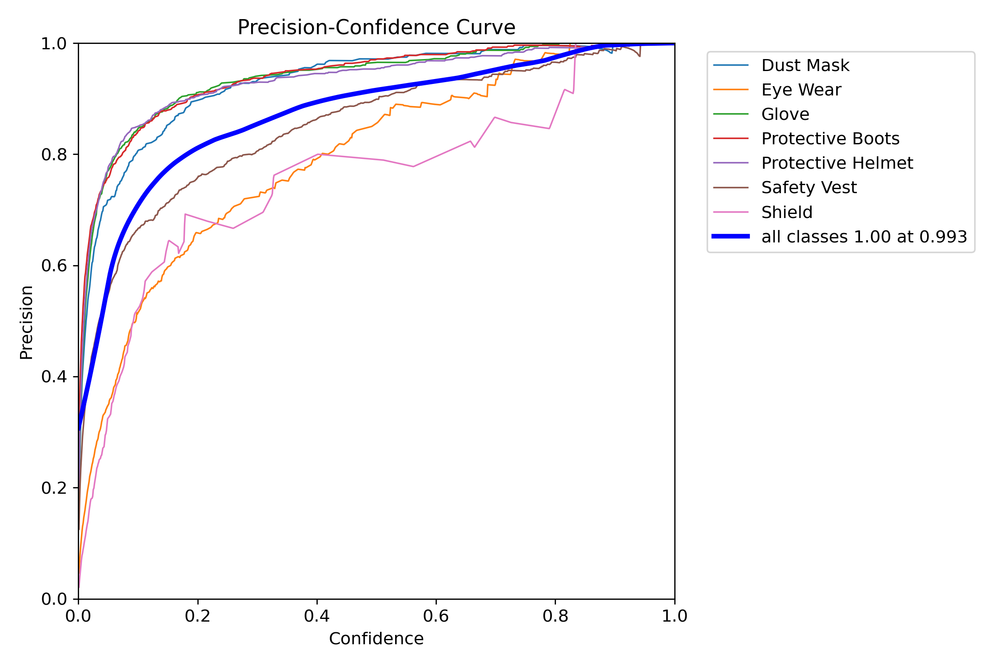

In [16]:
Image("/content/runs/detect/train/BoxP_curve.png", width=600)

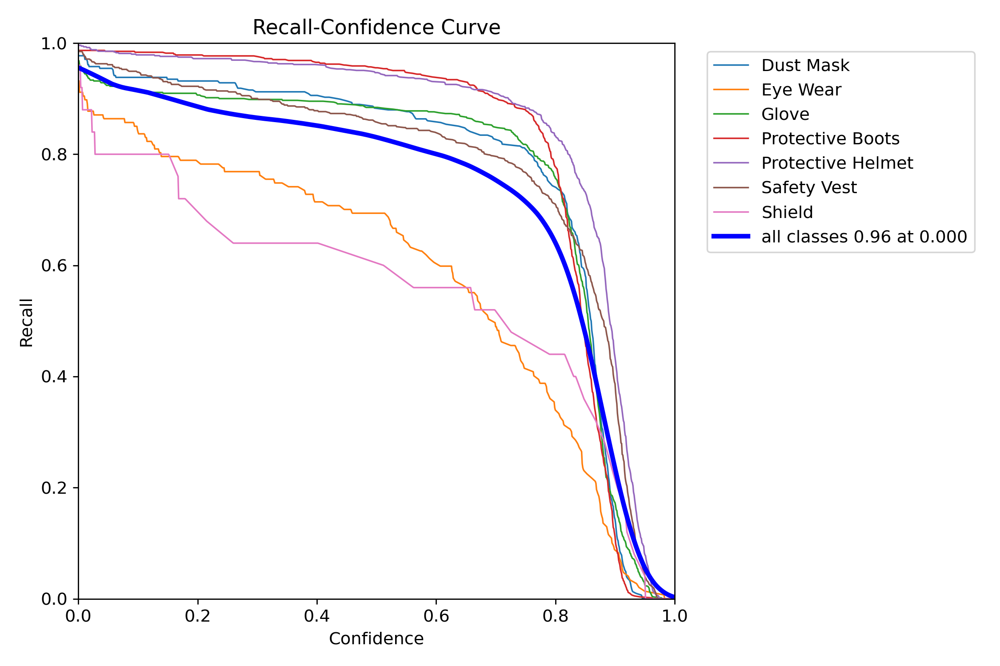

In [17]:
Image("/content/runs/detect/train/BoxR_curve.png", width=600)

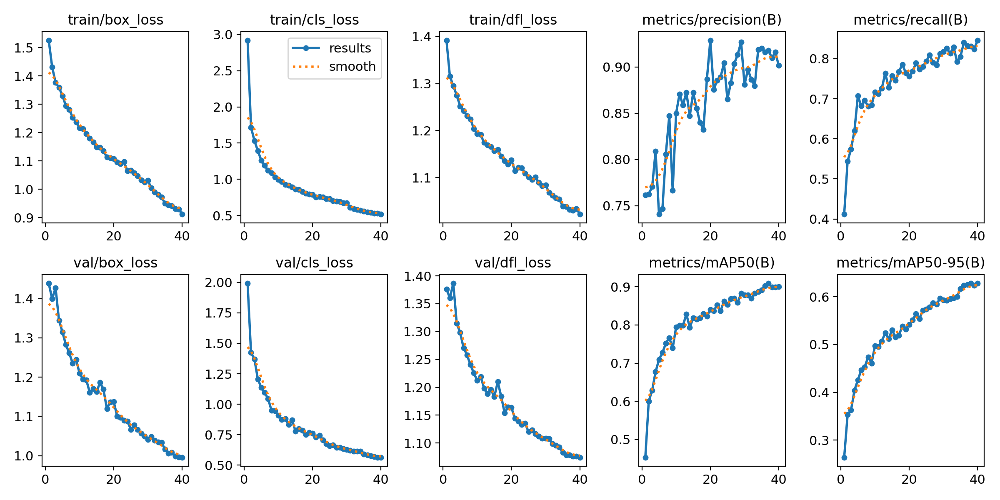

In [20]:
Image("/content/runs/detect/train/results.png", width=600)

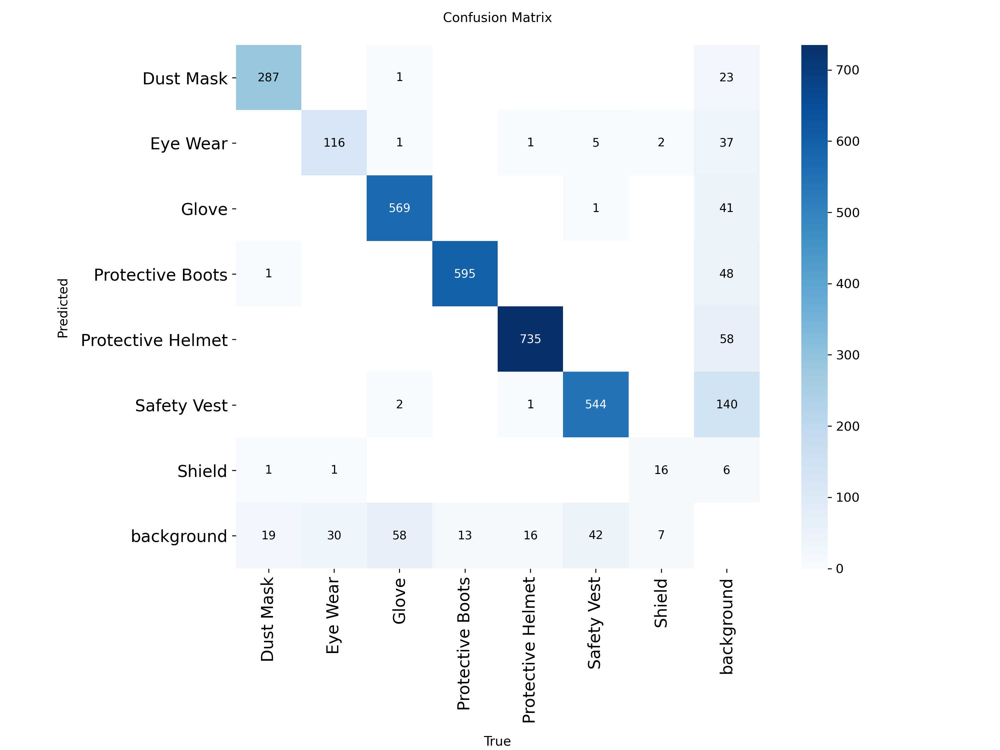

In [22]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

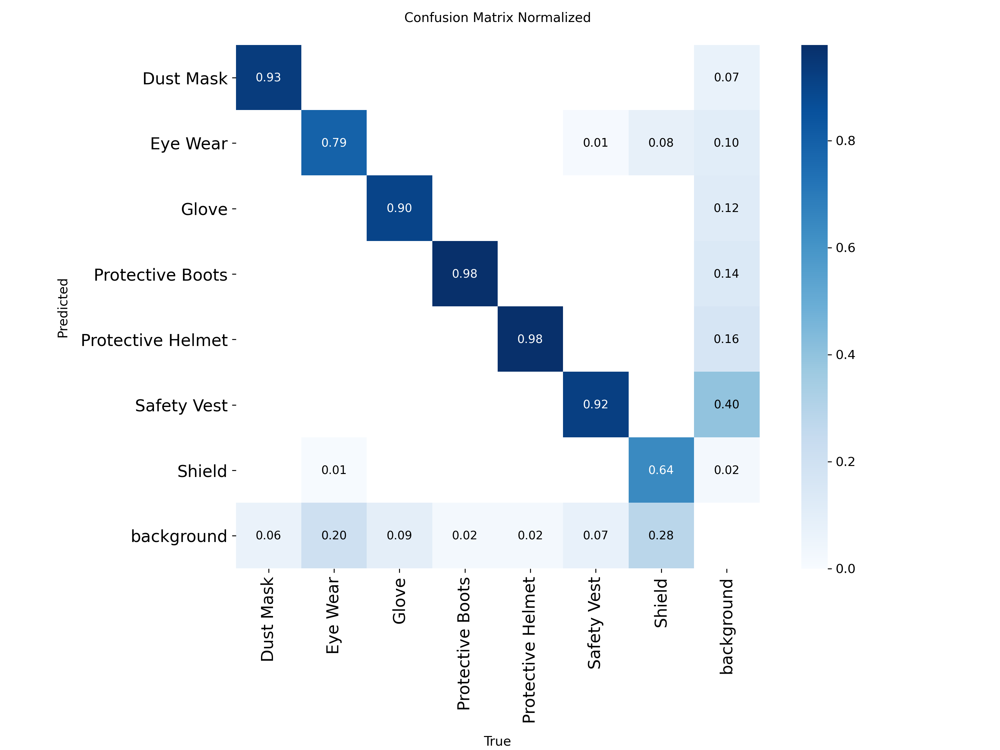

In [23]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=600)

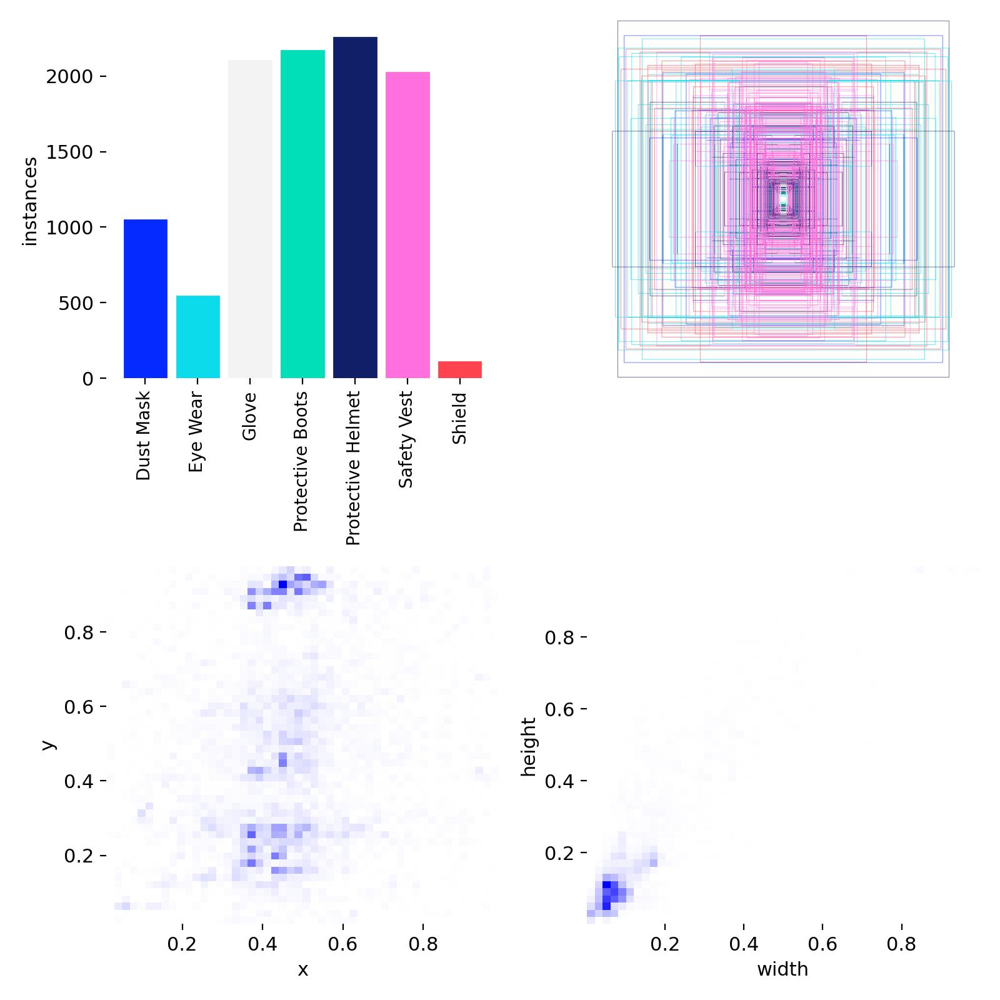

In [24]:
Image("/content/runs/detect/train/labels.jpg", width=600)

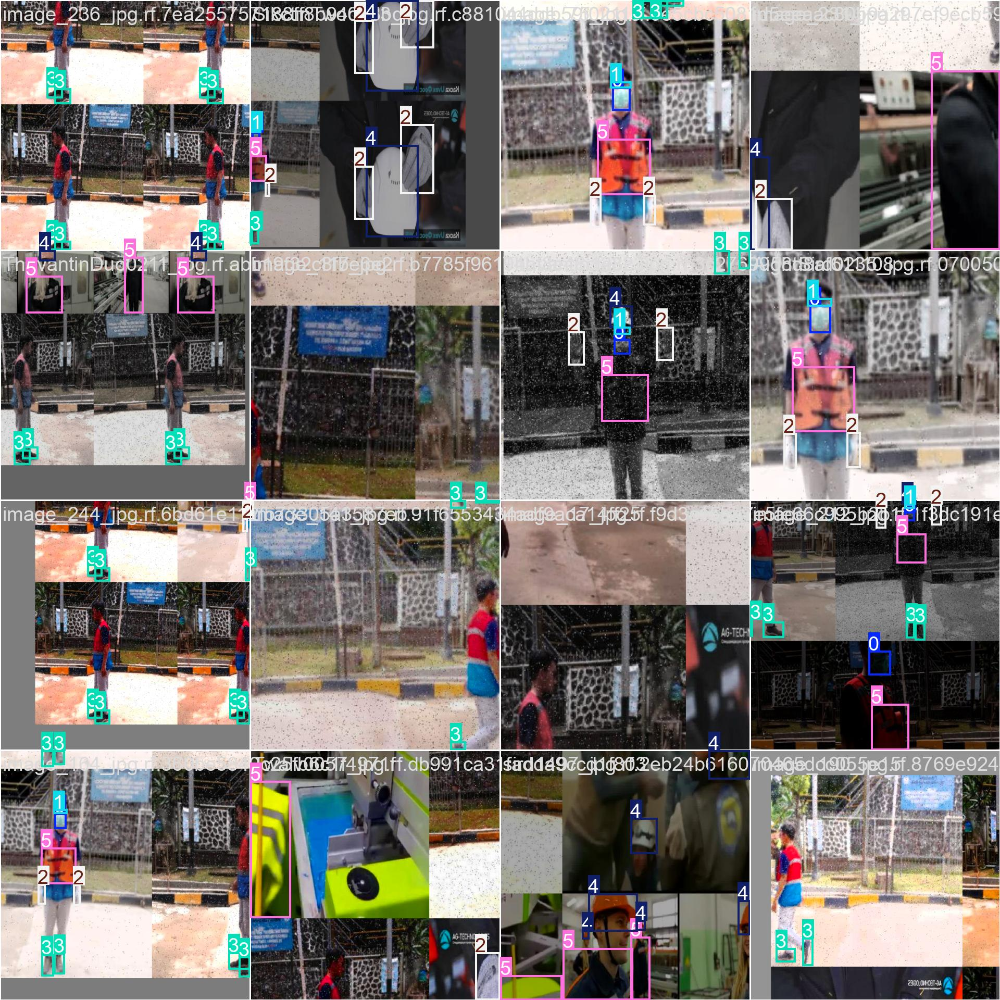

In [25]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

Mount google drive to colab

In [27]:
# mount google drive

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [29]:
#move model to gogle drive


!mv /content/runs/detect/train/weights/best.pt /content/drive/MyDrive/YOLO11_ppe_model/

In [30]:
# sample model can also be downloaded from here

!gdown "https://drive.google.com/uc?id=1iuIB_3vKBunhyxEPhuecWPAWgVY71BNF&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1iuIB_3vKBunhyxEPhuecWPAWgVY71BNF&confirm=t
To: /content/best.pt
100% 5.47M/5.47M [00:00<00:00, 85.8MB/s]


Validate the model

In [31]:
!yolo task=detect mode=val model="best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2062.5±1131.2 MB/s, size: 82.6 KB)
val: Scanning /content/PPE_Detection-2/valid/labels.cache... 637 images, 0 backgrounds, 0 corrupt: 100% 637/637 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 40/40 [00:09<00:00,  4.09it/s]
                   all        637       3064      0.905      0.847      0.905      0.629
             Dust Mask        299        308      0.982      0.899      0.958      0.671
              Eye Wear        146        147      0.865      0.728      0.778      0.443
                 Glove        346        631      0.966      0.883      0.943      0.671
      Protective Boots        298        608      0.968      0.961      0.982      0.694
     Protective Helmet        403        753     

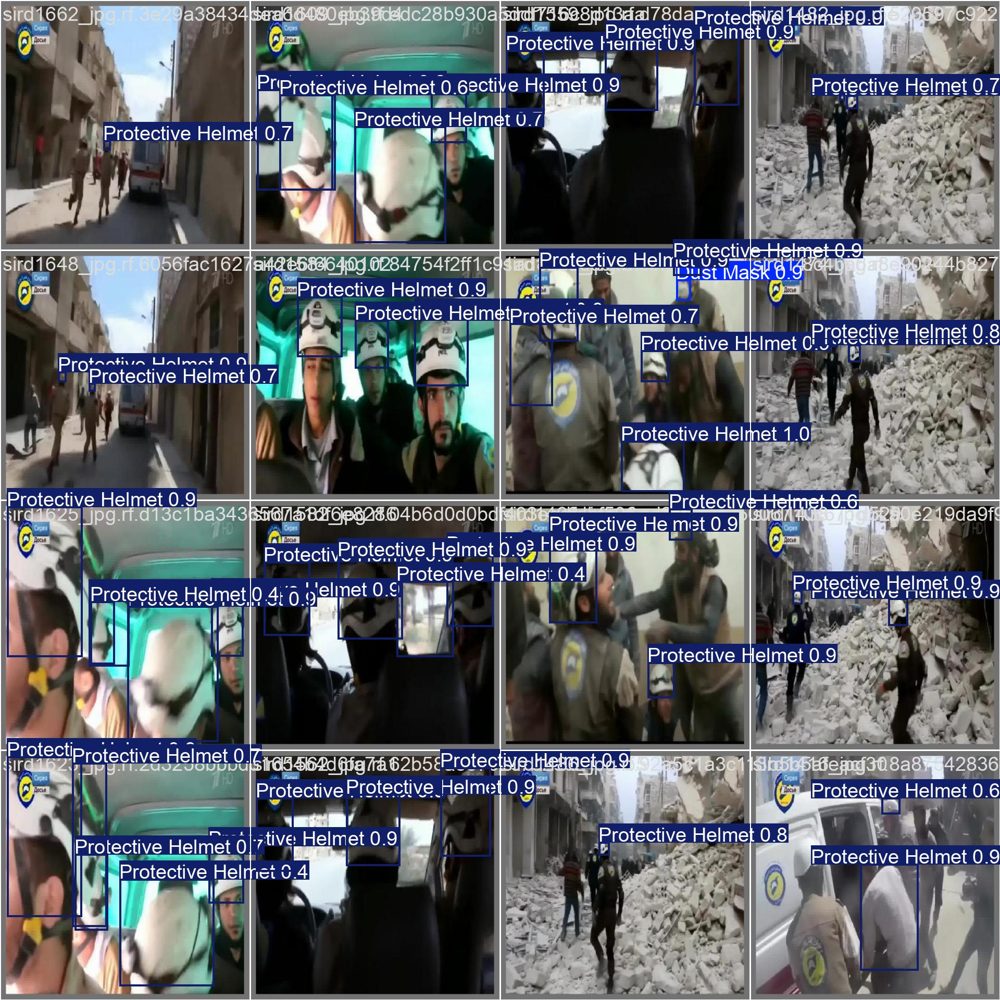

In [32]:
# Sample validation test batch
Image("/content/runs/detect/val/val_batch0_pred.jpg")

Now run the test data set

In [33]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/322 /content/PPE_Detection-2/test/images/000446_jpg.rf.63a960737ed4b762294eea1ad1a92791.jpg: 640x640 1 Glove, 2 Protective Helmets, 14.3ms
image 2/322 /content/PPE_Detection-2/test/images/20220721_161946_jpg.rf.905c375aa964159f9edab2a55a6e7476.jpg: 640x640 (no detections), 9.2ms
image 3/322 /content/PPE_Detection-2/test/images/20220721_162015_jpg.rf.ccb5d8a5aed0bb50c04431fa0b0d5479.jpg: 640x640 1 Dust Mask, 8.5ms
image 4/322 /content/PPE_Detection-2/test/images/20220721_162036_jpg.rf.2664c2f59604cd2380a51fd174055a7e.jpg: 640x640 1 Dust Mask, 1 Glove, 8.0ms
image 5/322 /content/PPE_Detection-2/test/images/20220721_162308_jpg.rf.913971a6c64f38eabc6b69bab4409b46.jpg: 640x640 1 Dust Mask, 1 Eye Wear, 8.1ms
image 6/322 /content/PPE_Detection-2/test/images/20220721_162435_jpg.rf.d478427044384d4e32ba0c25b15b720d.jpg: 640

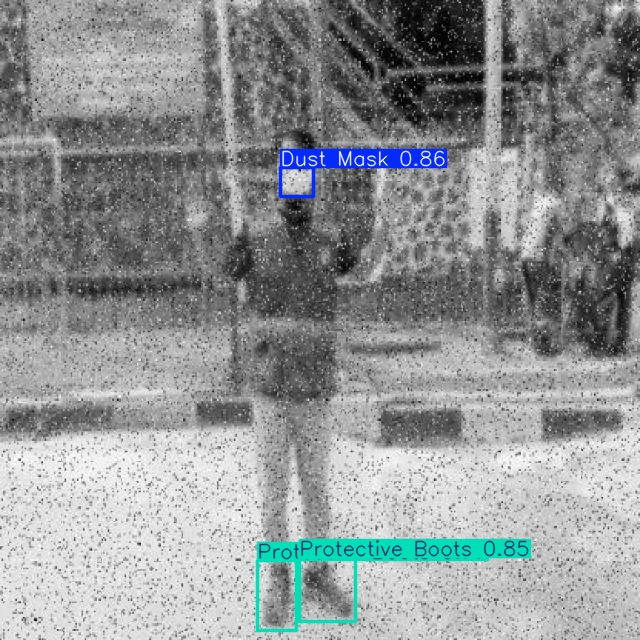

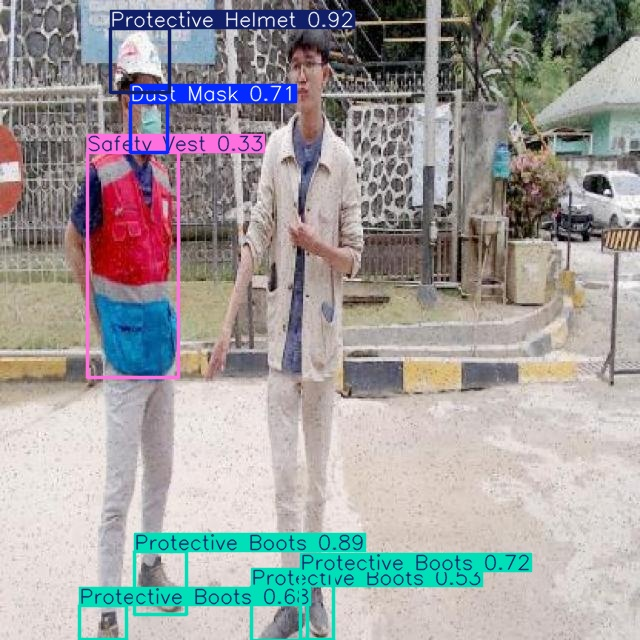

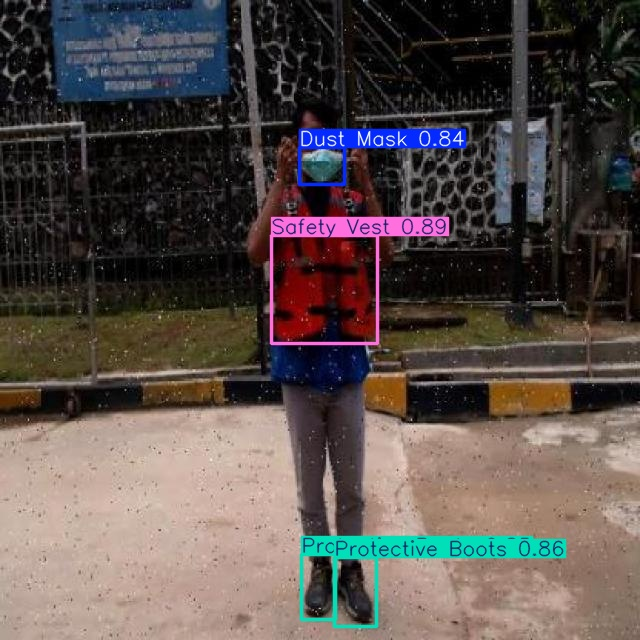

In [40]:
# display some sample predictions

import glob
import os
from IPython.display import Image as IPyImage, display

later_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)

for img in glob.glob(f"{later_folder}/*.jpg")[1:4]:
  display(IPyImage(filename=img, width=600))
  print("\n")

In [43]:
# download video
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 46.0MB/s]


In [44]:
# run detection on the video
!yolo task=detect mode=predict model= best.pt conf=0.25 source="PPE_Part1.mp4" save=True

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 3 Safety Vests, 52.1ms
video 1/1 (frame 2/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 2 Safety Vests, 12.7ms
video 1/1 (frame 3/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 2 Safety Vests, 8.9ms
video 1/1 (frame 4/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 2 Safety Vests, 11.5ms
video 1/1 (frame 5/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 2 Safety Vests, 13.4ms
video 1/1 (frame 6/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 2 Safety Vests, 13.9ms
video 1/1 (frame 7/310) /content/PPE_Part1.mp4: 384x640 4 Protective Helmets, 3 Safety Vests, 12.1ms
video 1/1 (frame 8/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 4 Safety Vests, 14.2ms
video 1/1 (frame 9/310) /c

In [45]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 87.6MB/s]


In [46]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)